In [ ]:
import numpy as np
import cv2
import os
import random
import matplotlib.pyplot as plt
from collections import deque
from keras.utils import to_categorical
from keras.models import Model
from keras.layers import Input, Dense, Conv2D, Flatten, concatenate
from keras.optimizers import Adam, RMSprop
from keras import backend as K
from IPython.display import clear_output
from IPython.display import Image
import imageio
import shutil

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Functions and classes

In [ ]:
class Minesweeper(object):
  '''
  Class of minesweeper game
  Input parameters:
    - mines_count - number of mines on playfield
    - playfield_size - length of square playfield side
  '''

  def __init__(self, mines_count, playfield_size):
    self.mines_count = mines_count
    self.playfield_size = playfield_size
    # Actions for locate all points around current point (clockwise)
    self.actions = [(-1,-1), (-1,0), (-1,1), (0,1), (1,1), (1,0), (1,-1), (0,-1)]

  # Create fake playfield (need for mines placement)
  def _create_playground(self):
    self.playground = np.zeros((self.playfield_size+2,self. playfield_size+2))
    return self.playground

  # Create filed for mines placement
  def _create_minesfield(self):
    self.minesfield = np.full((self.playfield_size, self.playfield_size), 9)
    return self.minesfield

  # First step coordinates
  def _first_step(self):
    x = np.random.randint(0, self.playfield_size)
    y = np.random.randint(0, self.playfield_size)
    return (x, y)

  # Create mines in random places exept first_step_coord
  def _place_mines(self):
    first_step_coord = self._first_step()

    first_point_surround = []
    for act in self.actions:
      x1 = first_step_coord[0] + act[0]
      y1 = first_step_coord[1] + act[1]
      first_point_surround.append((x1, y1))

    self.mines_coord = []
    while len(self.mines_coord) < self.mines_count:
      x = np.random.randint(0, self.playfield_size)
      y = np.random.randint(0, self.playfield_size)

      if ((x, y) != first_step_coord) and ((x, y) not in self.mines_coord) and ((x, y) not in first_point_surround):
        self.mines_coord.append((x, y))

    return first_step_coord

  # Create stealth playfield with mines around count
  def _mines_number(self):
    mines_round =[]
    for mine in self.mines_coord:
      mines_round.append((mine[0]+1, mine[1]+1))

    field = np.zeros_like(self.playground)

    for i in range(1, self.playfield_size+1):
      for j in range(1, self.playfield_size+1):
        if (i, j) in mines_round:
          continue
        
        field_round = [(i-1,j-1), (i-1,j), (i-1,j+1),
                       (i,j-1), (i,j), (i,j+1),
                       (i+1,j-1), (i+1,j), (i+1,j+1)]
        mines_count = 0
        for point in field_round:
          mines_count += self.playground[point]
        field[i,j] = mines_count

    return field[1:-1, 1:-1]

  # Create fake playfield where stored information abount point surrunding
  def _create_playfield(self):
    for mine in self.mines_coord:
      x = mine[0] + 1
      y = mine[1] + 1
      self.playground[(x,y)] = 1

    self.fake_playfield = self._mines_number()

  # Check if step has reason (step in near field of open points)
  def _yolo_move(self, action):

    for act in self.actions:
      x1 = action[0] + act[0]
      y1 = action[1] + act[1]
      if (x1, y1) in self.free_point:
        return False
    
    return True

  # Open all connected zeros in playfield (for game acceleration)
  def open_zeros(self):
    
    done = True
    scale_reward = 0
    while done:
      k = 0
      for point in self.free_point.copy():
        if self.minesfield[point] == 0:
          
          for act in self.actions:
            x = point[0] + act[0]
            y = point[1] + act[1]
            if x in range(self.playfield_size) and y in range(self.playfield_size):
              if self.minesfield[(x,y)] == 9:
                k = 1
                scale_reward += 1
                self.free_point.add((x,y))
                self.minesfield[(x,y)] = self.fake_playfield[(x,y)]
      if k == 0:
        return scale_reward

  # Initialize field for game
  def initialize_game(self):

    self._create_playground()

    self.free_point = set()
    first_step_coord = self._place_mines()
    self.free_point.add(first_step_coord)

    self._create_playfield()
    self._create_minesfield()
    self.minesfield[first_step_coord] = self.fake_playfield[first_step_coord]

  # Open minesfield point or die 
  def step(self, action):
    x = action[0]
    y = action[1]

    # Check if current step coordinates in mines_coord
    if (x,y) in self.mines_coord:
      self.free_point.add((x,y))
      # self.minesfield[(x,y)] = 10
      reward = -1
      done = True
    
    # Check if current step coordinates is already done
    elif (x,y) in self.free_point:
      reward = -0.3
      done = False
      
    else:
      # Add point in set of free points
      self.free_point.add((x,y))
      # Check if current step coordinates is yolo move
      if self._yolo_move((x,y)):
        self.minesfield[(x,y)] = self.fake_playfield[(x,y)]
        reward = -0.3
        done = False
      else:
        # Check if current step coordinates is last free point (win)
        if len(self.free_point) == int(self.playfield_size*self.playfield_size) - self.mines_count:
          self.minesfield[(x,y)] = self.fake_playfield[(x,y)]
          reward = 1
          done = True
        # Check if current step coordinates is not last free point
        else:
          self.minesfield[(x,y)] = self.fake_playfield[(x,y)]
          reward = 0.9
          done = False

    return self.minesfield, reward, done

In [ ]:
class Agent(object):
  '''
  Class of agent for play minesweeper
  Input parameters:
    - playfield_size - length of square playfield side
    - epsilon - start value of probability of random step selection
  '''

  def __init__(self, playfield_size, epsilon):

    self.load_model = True # Always loading model if it is exist

    self.checkpoint_dir = checkpoint_dir # Path where model is saved

    self.playfield_size = playfield_size 
    self.num_actions = int(playfield_size * playfield_size) # Number of possible actions
    self.state_size = (self.playfield_size, playfield_size, 10) # Shape of model input tensor
    
    self.epsilon = epsilon
    self.epsilon_start, self.epsilon_end = 1.0, 0.1 # Parameters for epsilon_decay_step calculation
    self.exploration_steps = 500000 # Parameters for epsilon_decay_step calculation
    self.epsilon_decay_step = (self.epsilon_start - self.epsilon_end) / self.exploration_steps

    self.batch_size = 16 # Batch size for model learning
    self.train_start = 20000 # Minimal memory size for start learning
    self.update_target_rate = 20000 # After each ... steps update target model
    self.discount_factor = 0.0 # Discount factor in Bellman equation
    self.memory = deque(maxlen=40000) # Number of play situations for learning

    self.model = self.build_model() 
    self.target_model = self.build_model()
    self.update_target_model()
    
    self.avg_q_max, self.avg_loss = 0., 0.

    if self.load_model:
      if os.path.exists(os.path.join(self.checkpoint_dir, 'curr_ckpt.h5')) is True:
        self.model.load_weights(os.path.join(self.checkpoint_dir, 'curr_ckpt.h5'))

  def build_model(self):
    input = Input(shape=(self.state_size))

    x1 = Conv2D(32, (5,5), padding='same', activation='tanh')(input)
    x1 = Conv2D(32, (3,3), padding='same', activation='tanh')(x1)
    
    x2 = Conv2D(32, (3,3), padding='same', activation='tanh')(input)
    x = concatenate([x1, x2])
    x = Conv2D(64, (3,3), padding='same', activation='linear')(x)
    # x = Conv2D(64, (3,3), padding='same', activation='relu')(x)
    output = Conv2D(1, (1,1), padding='same', activation='linear')(x)
    # x = Flatten()(x)
    # x = Dense(512, activation='relu')(x)
    # output = Dense(self.num_actions, activation='linear')(x)

    model = Model(input, output)
    model.compile(optimizer=RMSprop(lr=1e-4, epsilon=0.01),
                  loss='mse')
    
    return model

  # Load in target model weigths of current model
  def update_target_model(self):
    self.target_model.set_weights(self.model.get_weights())

  # Select action
  def get_action(self, history):
    if np.random.rand() <= self.epsilon:
      return int(np.random.uniform(self.num_actions))
    else:
      q_value = self.model.predict(np.expand_dims(history, axis=0))
      return np.argmax(q_value)

  # Add play situation in memory
  def replay_memory(self, history, action, reward, next_history, done):
    self.memory.append((history, action, reward, next_history, done))

  # Train current model on batch
  def train_replay(self):
    if len(self.memory) < self.train_start:
      return
    if self.epsilon > self.epsilon_end:
      self.epsilon -= self.epsilon_decay_step

    mini_batch = random.sample(self.memory, self.batch_size)

    history = np.zeros((self.batch_size, self.state_size[0],
                        self.state_size[1], self.state_size[2]))
    next_history = np.zeros((self.batch_size, self.state_size[0],
                             self.state_size[1], self.state_size[2]))
    target = np.zeros((self.batch_size))

    action, reward, done = [], [], []

    for i in range(self.batch_size):
      history[i] = np.float32(mini_batch[i][0])
      next_history[i] = np.float32(mini_batch[i][3])
      action.append(mini_batch[i][1])
      reward.append(mini_batch[i][2])
      done.append(mini_batch[i][4])

    target_value = self.target_model.predict(next_history)
    q_value = self.model.predict(history)

    for i in range(self.batch_size):
      if done[i]:
        target[i] = reward[i]
      else:
        target[i] = reward[i] + self.discount_factor * np.amax(target_value[i])

      xi = int(action[i] // self.playfield_size)
      yi = int(action[i] - xi * self.playfield_size)
      q_value[i][xi, yi] = target[i]
    
    loss = self.model.train_on_batch(history, q_value)

    self.avg_loss += loss

  # Save model in checkpoint_dir
  def save_model(self):
    self.model.save_weights(os.path.join(self.checkpoint_dir, 'curr_ckpt.h5'))

In [ ]:
def show_result(play, i, free_points, mines_coord):

  '''
  Функция отображения игрового поля
  Входные параметры:
   - play - игровое поле
   - free_points - координаты точек, куда сходили
   - mines_coord - координаты мин
  '''
  
  # fig = plt.figure()
  plt.imshow(play, cmap='Accent')
  plt.axis('off')
  for x in range(play.shape[0]):
    for y in range(play.shape[1]):
      if (x,y) in free_points:
        if (x,y) in mines_coord:
          label = 'boom!'
          plt.text(y, x, label, color='black', ha='center', va='center')
        else:
          label = play[(x, y)]
          plt.text(y, x, label, color='black', ha='center', va='center')

  plt.savefig(os.path.join(result_dir, str(i) + '.jpg'))
  plt.show()

In [ ]:
def train_minesweeper(episodes, episode_start, epsilon, global_step, advanced=False):
  '''
  Algorithm for training the agent to play minesweeper
  Input parameters:
    - episodes - number of game episodes for train
    - episode_start - start episode number (for continue training after loading)
    - epsilon - start value of probability of random step selection
    - global_step - number of iterations of agent learning on batch
    - advanced - flag for to open connected zeros on minesweeper field
  '''

  for episode in range(episode_start, episodes):

    done = False # Flag if game is ended
    step = 0 # Number of steps duirng game
    score = 0 # Total score after game

    # Update minesweeper
    test_minesweeper.initialize_game()
    # Get first playfiled state
    history = to_categorical(test_minesweeper.minesfield, 10)

    while not done:
      global_step += 1
      step += 1
      # Get action with agent
      action = agent.get_action(history)

      x = int(action // playfield_size)
      y = int(action - x * playfield_size)
      # Make step
      observe, reward, done = test_minesweeper.step((x,y))

      # If need open all connected zeros
      if advanced: 
        scale_reward = test_minesweeper.open_zeros()

      next_history = to_categorical(observe, 10)
      # Get value for predicted action
      agent.avg_q_max += np.amax(agent.model.predict(np.expand_dims(history, axis=0))[0])
      # Add situation in memory for learning
      agent.replay_memory(history, action, reward, next_history, done)
      # Train on batch
      agent.train_replay()
      if global_step % agent.update_target_rate == 0:
        agent.update_target_model()
      # If connected zeros were opened add reward for them
      if advanced:
        reward += 0.9 * scale_reward
      score += reward

      history = next_history

      if step > 50:
        done = True

      if done:

        scores.append(score)
        average_scores.append(agent.avg_q_max / float(step))
        print("ep:", episode, "  s.:", round(score,2), "  mem.len:",
              len(agent.memory), "  eps:", round(agent.epsilon,2),
              "  g_step:", global_step, "  av_q:",
              round(agent.avg_q_max / float(step),3), "  av_loss:",
              round(agent.avg_loss / float(step),7))

        agent.avg_q_max, agent.avg_loss = 0, 0

    if episode % 500 == 0:
      agent.save_model()
      step_info = np.array([episode, global_step])
      np.save(os.path.join(checkpoint_dir, 'step_info.npy'), step_info)
      np.save(os.path.join(checkpoint_dir, 'scores.npy'), scores)
      np.save(os.path.join(checkpoint_dir, 'average_scores.npy'), average_scores)

In [ ]:
def test_minesweeper_game():

  '''
  Single episode playback and print information function
  Output parameters:
    - step_filed - list of playfield states during game
  '''

  step_filed = []
  done = False # Flag if game is ended
  step = 0 # Number of steps duirng game
  score = 0 # Total score after game
  # Update minesweeper
  test_minesweeper.initialize_game()
  step_filed.append(test_minesweeper.minesfield.copy())
  # Get first playfiled state
  history = to_categorical(test_minesweeper.minesfield, 10)

  while not done:

    step += 1
    predict = agent.model.predict(np.expand_dims(history, axis=0))[0]
    index = np.argmax(predict)
    # Print value matrix of prediction
    for i, pred in enumerate(predict.flatten()):
      if i % 8 == 0:
        print()
      if index == i:
        # Highlight maximum value 
        print('\033[0;37;45m' + str(round(pred,2)) + '\033[0;37;48m' + ' '*(8-len(str(round(pred,2)))), end=' ')
      else:
        print(str(round(pred,2)) + ' '*(8-len(str(round(pred,2)))), end=' ')
    print('\n\n')
    # Get action with agent
    action = agent.get_action(history)

    x = int(action // playfield_size)
    y = int(action - x * playfield_size)
    # Make step
    observe, reward, done = test_minesweeper.step((x,y))
    # Open connected zeros
    scale_reward = test_minesweeper.open_zeros()
    # Get full step reward
    reward += 0.9 * scale_reward

    step_filed.append(observe.copy())

    next_history = to_categorical(observe, 10)

    score += reward

    history = next_history

    if step > 40:
      done = True

  print(score)
  return step_filed

In [ ]:
def check_winrate(boom=False):
  '''
  Function for winrate culculation
  Input parameters:
    - boom - flag for counting lose only if step coordinate in mines coordinate
  Output parameters:
    - 1 - if win, 0 - if lose
  '''

  done = False # Flag if game is ended
  step = 0 # Number of steps duirng game
  score = 0 # Total score after game
  
  test_minesweeper.initialize_game() # Update minesweeper
  
  history = to_categorical(test_minesweeper.minesfield, 10) # Get first playfiled state

  while not done:

    step += 1

    action = agent.get_action(history)

    x = int(action // playfield_size)
    y = int(action - x * playfield_size)
    
    observe, reward, done = test_minesweeper.step((x,y)) # Make step

    scale_reward = test_minesweeper.open_zeros() # Open connected zeros
 
    reward += 0.9 * scale_reward # Get full step reward

    next_history = to_categorical(observe, 10)

    score += reward

    history = next_history

    if step > 40:
      done = True

  if boom:
    if reward != -1:
      return 1
    else:
      return 0
  else:
    if reward == 1:
      return 1
    else:
      return 0

# Training

## 1 iteration

In [ ]:
scores = []
average_scores = []
episode_start = 1
global_step = 0
playfield_size = 8
mines_count = 10
epsilon = 0.7
checkpoint_dir = '/content/drive/MyDrive/diplom/variant_2/'
episodes = 1000000

test_minesweeper = Minesweeper(mines_count, playfield_size)
agent = Agent(playfield_size, epsilon)

In [ ]:
train_minesweeper(episodes, episode_start, epsilon, global_step, advanced=True)

Streaming output truncated to the last 5000 lines.
ep: 12509   s.: 18.5   mem.len: 40000   eps: 0.6   g_step: 76388   av_q: 0.342   av_loss: 0.0037773
ep: 12510   s.: 17.9   mem.len: 40000   eps: 0.6   g_step: 76389   av_q: 0.058   av_loss: 0.0062712
ep: 12511   s.: 36.2   mem.len: 40000   eps: 0.6   g_step: 76402   av_q: 0.034   av_loss: 0.0067041
ep: 12512   s.: 24.8   mem.len: 40000   eps: 0.6   g_step: 76420   av_q: 0.194   av_loss: 0.0056361
ep: 12513   s.: 26.6   mem.len: 40000   eps: 0.6   g_step: 76425   av_q: 0.414   av_loss: 0.0072135
ep: 12514   s.: 23.6   mem.len: 40000   eps: 0.6   g_step: 76428   av_q: 0.287   av_loss: 0.0044082
ep: 12515   s.: 35.0   mem.len: 40000   eps: 0.6   g_step: 76441   av_q: 0.383   av_loss: 0.0056319
ep: 12516   s.: 26.0   mem.len: 40000   eps: 0.6   g_step: 76446   av_q: 0.383   av_loss: 0.0060964
ep: 12517   s.: 15.5   mem.len: 40000   eps: 0.6   g_step: 76452   av_q: 0.133   av_loss: 0.0045388
ep: 12518   s.: 17.0   mem.len: 40000   eps: 0.6 

## 2 iteration

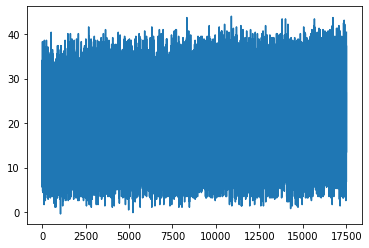

In [ ]:
scores_history = np.load('/content/drive/MyDrive/diplom/variant_2(v3)/scores.npy')

plt.plot(scores_history)
plt.show()

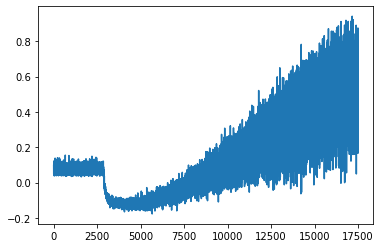

In [ ]:
scores_history = np.load('/content/drive/MyDrive/diplom/variant_2(v3)/average_scores.npy')

plt.plot(scores_history)
plt.show()

In [ ]:
checkpoint_dir = '/content/drive/MyDrive/diplom/variant_2/'
episode_start, global_step = np.load(os.path.join(checkpoint_dir, 'step_info.npy')).tolist()
scores = np.load(os.path.join(checkpoint_dir, 'scores.npy')).tolist()
average_scores = np.load(os.path.join(checkpoint_dir, 'average_scores.npy')).tolist()
playfield_size = 8
mines_count = 10
epsilon = 0.53
episodes = 1000000

test_minesweeper = Minesweeper(mines_count, playfield_size)
agent = Agent(playfield_size, epsilon)

In [ ]:
step_field = test_minesweeper_game()


-0.27    -0.35    -0.32    -0.34    -0.36    -0.34    -0.36    -0.31    
-0.32    -0.34    -0.29    -0.32    -0.32    -0.26    -0.27    -0.12    
-0.34    -0.25    -0.21    -0.24    -0.23    -0.2     -0.16    -0.18    
-0.29    -0.25    -0.24    -0.29    -0.29    -0.26    -0.24    -0.3     
-0.26    -0.14    -0.21    -0.25    -0.25    -0.21    -0.19    -0.28    
-0.42    -0.1     -0.13    -0.18    -0.19    -0.15    -0.15    -0.26    
-0.2     0.2      -0.2     -0.18    -0.14    -0.08    -0.02    -0.19    
-0.54    -0.29    -0.39    -0.29    -0.33    -0.26    -0.15    -0.24    


1.7000000000000002


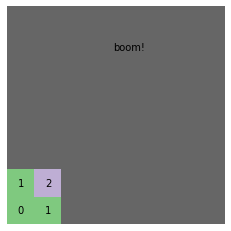

In [ ]:
result_dir = '/content/result_images/'

if os.path.exists(result_dir) is True:
  shutil.rmtree(result_dir)

os.mkdir(result_dir)

for i, field in enumerate(step_field):
  clear_output(wait=1000)
  show_result(field, i, test_minesweeper.free_point, test_minesweeper.mines_coord)

In [ ]:
train_minesweeper(episodes, episode_start, epsilon, global_step, advanced=True)

Streaming output truncated to the last 5000 lines.
ep: 33895   s.: 20.6   mem.len: 40000   eps: 0.35   g_step: 228830   av_q: 0.943   av_loss: 0.0013895
ep: 33896   s.: 37.4   mem.len: 40000   eps: 0.35   g_step: 228852   av_q: 0.399   av_loss: 0.004006
ep: 33897   s.: 26.0   mem.len: 40000   eps: 0.35   g_step: 228854   av_q: 0.807   av_loss: 0.0035726
ep: 33898   s.: 20.6   mem.len: 40000   eps: 0.35   g_step: 228858   av_q: 0.793   av_loss: 0.0017243
ep: 33899   s.: 30.8   mem.len: 40000   eps: 0.35   g_step: 228864   av_q: 0.728   av_loss: 0.0035505
ep: 33900   s.: 23.3   mem.len: 40000   eps: 0.35   g_step: 228869   av_q: 0.486   av_loss: 0.0039892
ep: 33901   s.: 19.4   mem.len: 40000   eps: 0.35   g_step: 228871   av_q: 0.802   av_loss: 0.0027644
ep: 33902   s.: 29.6   mem.len: 40000   eps: 0.35   g_step: 228886   av_q: 0.629   av_loss: 0.0036073
ep: 33903   s.: 37.4   mem.len: 40000   eps: 0.35   g_step: 228905   av_q: 0.486   av_loss: 0.0035388
ep: 33904   s.: 19.4   mem.len: 

## 3 iteration

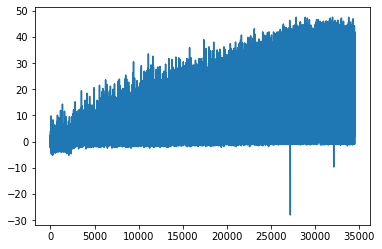

In [ ]:
scores_history = np.load('/content/drive/MyDrive/diplom/variant_2/scores.npy')

plt.plot(scores_history)
plt.show()

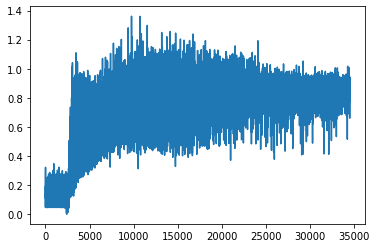

In [ ]:
scores_history = np.load('/content/drive/MyDrive/diplom/variant_2/average_scores.npy')

plt.plot(scores_history)
plt.show()

In [ ]:
checkpoint_dir = '/content/drive/MyDrive/diplom/variant_2/'
episode_start, global_step = np.load(os.path.join(checkpoint_dir, 'step_info.npy')).tolist()
scores = np.load(os.path.join(checkpoint_dir, 'scores.npy')).tolist()
average_scores = np.load(os.path.join(checkpoint_dir, 'average_scores.npy')).tolist()
playfield_size = 8
mines_count = 10
epsilon = 0.05
episodes = 1000000

test_minesweeper = Minesweeper(mines_count, playfield_size)
agent = Agent(playfield_size, epsilon)

In [ ]:
step_field = test_minesweeper_game()


-0.0     -0.26    -0.26    -0.22    -0.22    -0.24    -0.25    -0.26    
-0.34    -0.4     -0.36    -0.3     -0.37    -0.38    -0.34    -0.29    
-0.29    -0.31    -0.33    -0.2     -0.34    -0.19    -0.3     -0.26    
-0.31    -0.42    0.37     0.66     0.46     -0.4     -0.31    -0.26    
-0.27    -0.32    0.51     -0.23    0.57     -0.43    -0.29    -0.26    
-0.25    -0.53    0.31     0.39     0.8      -0.43    -0.3     -0.27    
-0.24    -0.36    -0.48    -0.42    -0.31    -0.23    -0.28    -0.24    
-0.27    -0.37    -0.26    -0.25    -0.3     -0.25    -0.32    -0.16    



-0.0     -0.26    -0.26    -0.22    -0.22    -0.24    -0.25    -0.26    
-0.34    -0.4     -0.36    -0.3     -0.37    -0.38    -0.34    -0.29    
-0.29    -0.35    -0.35    -0.22    -0.33    -0.25    -0.31    -0.29    
-0.31    -0.44    0.41     0.58     0.5      -0.46    -0.19    -0.26    
-0.27    -0.37    0.43     -0.04    0.85     0.28     -0.39    -0.26    
-0.25    -0.52    0.31     0.77     0.12     0.

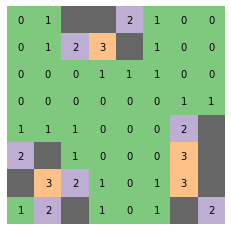

In [ ]:
result_dir = '/content/result_images/'

if os.path.exists(result_dir) is True:
  shutil.rmtree(result_dir)

os.mkdir(result_dir)

for i, field in enumerate(step_field):
  clear_output(wait=1000)
  show_result(field, i, test_minesweeper.free_point, test_minesweeper.mines_coord)

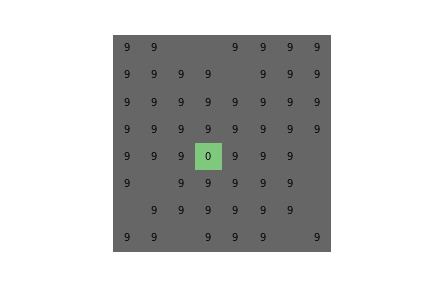

In [ ]:
images = [imageio.imread(os.path.join(result_dir, str(id) + '.jpg')) for id in range(len(os.listdir(result_dir)))]
imageio.mimsave('mw.gif', images)
Image(open('mw.gif','rb').read())

In [ ]:
step_field = test_minesweeper_game()


-0.0     -0.26    -0.25    0.65     -0.52    0.64     -0.34    -0.25    
-0.31    -0.35    -0.42    0.42     0.48     0.79     -0.41    -0.27    
-0.27    -0.35    -0.28    -0.48    -0.44    -0.35    -0.26    -0.26    
-0.26    -0.41    -0.33    -0.24    -0.21    -0.31    -0.3     -0.31    
-0.26    -0.39    -0.3     -0.25    -0.25    -0.29    -0.29    -0.26    
-0.27    -0.42    -0.34    -0.32    -0.32    -0.32    -0.31    -0.27    
-0.26    -0.38    -0.3     -0.27    -0.27    -0.28    -0.28    -0.24    
-0.25    -0.34    -0.28    -0.28    -0.28    -0.25    -0.26    -0.16    



-0.0     -0.26    -0.27    0.61     -0.36    0.91     0.3      -0.35    
-0.31    -0.35    -0.41    0.42     0.86     0.15     0.46     -0.38    
-0.27    -0.35    -0.25    -0.53    0.33     0.37     0.88     -0.36    
-0.26    -0.41    -0.3     -0.22    -0.39    -0.46    -0.32    -0.27    
-0.26    -0.39    -0.32    -0.28    -0.24    -0.25    -0.31    -0.26    
-0.27    -0.42    -0.34    -0.32    -0.32    -0

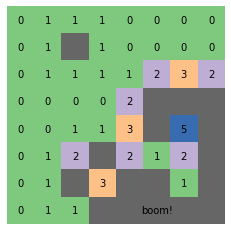

In [ ]:
result_dir = '/content/result_images/'

if os.path.exists(result_dir) is True:
  shutil.rmtree(result_dir)

os.mkdir(result_dir)

for i, field in enumerate(step_field):
  clear_output(wait=1000)
  show_result(field, i, test_minesweeper.free_point, test_minesweeper.mines_coord)

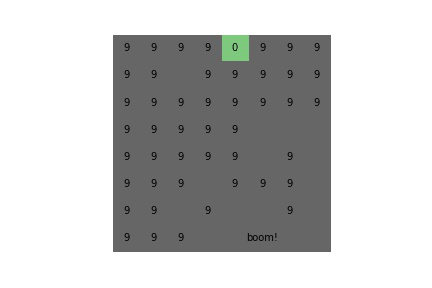

In [ ]:
images = [imageio.imread(os.path.join(result_dir, str(id) + '.jpg')) for id in range(len(os.listdir(result_dir)))]
imageio.mimsave('mw.gif', images)
Image(open('mw.gif','rb').read())

In [ ]:
train_minesweeper(episodes, epsilon, global_step, advanced=True)

ep: 1   s.: 32.0   mem.len: 19   eps: 0.05   g_step: 587987   av_q: 0.838   av_loss: 0.0
ep: 2   s.: 27.5   mem.len: 35   eps: 0.05   g_step: 588025   av_q: 0.884   av_loss: 0.0
ep: 3   s.: 39.5   mem.len: 55   eps: 0.05   g_step: 588071   av_q: 0.852   av_loss: 0.0
ep: 4   s.: 43.7   mem.len: 91   eps: 0.05   g_step: 588127   av_q: 0.82   av_loss: 0.0
ep: 5   s.: 20.0   mem.len: 107   eps: 0.05   g_step: 588154   av_q: 0.868   av_loss: 0.0
ep: 6   s.: 23.3   mem.len: 123   eps: 0.05   g_step: 588186   av_q: 0.822   av_loss: 0.0
ep: 7   s.: 11.6   mem.len: 130   eps: 0.05   g_step: 588201   av_q: 0.876   av_loss: 0.0
ep: 8   s.: 42.8   mem.len: 169   eps: 0.05   g_step: 588252   av_q: 0.733   av_loss: 0.0
ep: 9   s.: 18.5   mem.len: 181   eps: 0.05   g_step: 588276   av_q: 0.87   av_loss: 0.0
ep: 10   s.: 19.4   mem.len: 198   eps: 0.05   g_step: 588301   av_q: 0.785   av_loss: 0.0
ep: 11   s.: 41.9   mem.len: 223   eps: 0.05   g_step: 588355   av_q: 0.812   av_loss: 0.0
ep: 12   s.: 1

/usr/local/lib/python3.6/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


ep: 501   s.: 39.8   mem.len: 9804   eps: 0.05   g_step: 605301   av_q: 0.87   av_loss: 0.0
ep: 502   s.: 8.9   mem.len: 9810   eps: 0.05   g_step: 605313   av_q: 0.884   av_loss: 0.0
ep: 503   s.: 25.4   mem.len: 9824   eps: 0.05   g_step: 605390   av_q: 0.633   av_loss: 0.0
ep: 504   s.: 41.6   mem.len: 9863   eps: 0.05   g_step: 605441   av_q: 0.724   av_loss: 0.0
ep: 505   s.: 37.7   mem.len: 9890   eps: 0.05   g_step: 605485   av_q: 0.821   av_loss: 0.0
ep: 506   s.: 35.3   mem.len: 9919   eps: 0.05   g_step: 605529   av_q: 0.824   av_loss: 0.0
ep: 507   s.: 41.0   mem.len: 9950   eps: 0.05   g_step: 605578   av_q: 0.782   av_loss: 0.0
ep: 508   s.: 34.4   mem.len: 9977   eps: 0.05   g_step: 605621   av_q: 0.783   av_loss: 0.0
ep: 509   s.: 35.3   mem.len: 10004   eps: 0.05   g_step: 605665   av_q: 0.863   av_loss: 0.0
ep: 510   s.: 23.3   mem.len: 10022   eps: 0.05   g_step: 605693   av_q: 0.846   av_loss: 0.0
ep: 511   s.: 20.6   mem.len: 10041   eps: 0.05   g_step: 605722   av_

## 4 iteration

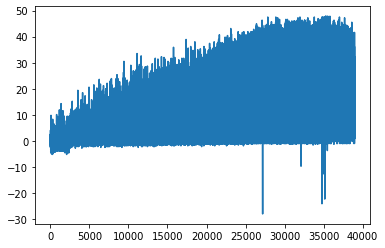

In [ ]:
scores_history = np.load('/content/drive/MyDrive/diplom/variant_2/scores.npy')

plt.plot(scores_history)
plt.show()

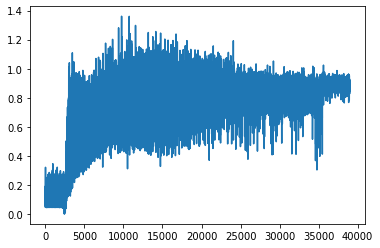

In [ ]:
scores_history = np.load('/content/drive/MyDrive/diplom/variant_2/average_scores.npy')

plt.plot(scores_history)
plt.show()

In [ ]:
checkpoint_dir = '/content/drive/MyDrive/diplom/variant_2/'
episode_start, global_step = np.load(os.path.join(checkpoint_dir, 'step_info.npy')).tolist()
scores = np.load(os.path.join(checkpoint_dir, 'scores.npy')).tolist()
average_scores = np.load(os.path.join(checkpoint_dir, 'average_scores.npy')).tolist()
playfield_size = 8
mines_count = 10
epsilon = 0.1
episodes = 1000000

test_minesweeper = Minesweeper(mines_count, playfield_size)
agent = Agent(playfield_size, epsilon)

In [ ]:
step_field = test_minesweeper_game()


-0.0     -0.26    -0.26    -0.23    -0.21    0.65     -0.57    0.63     
-0.31    -0.37    -0.33    -0.3     -0.4     0.41     0.47     0.81     
-0.27    -0.38    -0.3     -0.26    -0.27    -0.51    -0.47    -0.32    
-0.26    -0.39    -0.3     -0.27    -0.28    -0.28    -0.26    -0.27    
-0.26    -0.39    -0.3     -0.25    -0.25    -0.29    -0.29    -0.26    
-0.27    -0.42    -0.34    -0.32    -0.32    -0.32    -0.31    -0.27    
-0.26    -0.38    -0.3     -0.27    -0.27    -0.28    -0.28    -0.24    
-0.25    -0.34    -0.28    -0.28    -0.28    -0.25    -0.26    -0.16    



-0.0     -0.26    -0.2     -0.04    0.3      -0.32    -0.11    -0.35    
-0.31    -0.37    -0.31    -0.11    0.56     -0.42    -0.35    -0.56    
-0.27    -0.38    -0.25    -0.1     0.64     -0.29    -0.17    -0.24    
-0.26    -0.39    -0.34    -0.27    0.26     0.47     0.55     0.28     
-0.26    -0.39    -0.33    -0.31    -0.31    -0.21    -0.07    -0.08    
-0.27    -0.42    -0.37    -0.37    -0.37    -0

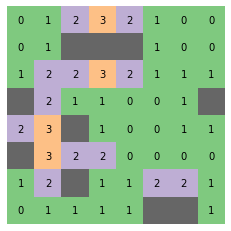

In [ ]:
result_dir = '/content/result_images/'

if os.path.exists(result_dir) is True:
  shutil.rmtree(result_dir)

os.mkdir(result_dir)

for i, field in enumerate(step_field):
  clear_output(wait=1000)
  show_result(field, i, test_minesweeper.free_point, test_minesweeper.mines_coord)

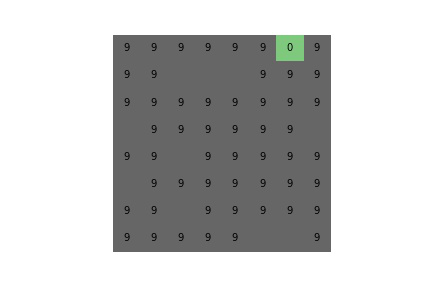

In [ ]:
images = [imageio.imread(os.path.join(result_dir, str(id) + '.jpg')) for id in range(len(os.listdir(result_dir)))]
imageio.mimsave('mw.gif', images)
Image(open('mw.gif','rb').read())

In [ ]:
train_minesweeper(episodes, epsilon, global_step, advanced=True)

ep: 1   s.: 47.5   mem.len: 17   eps: 0.1   g_step: 587965   av_q: 0.494   av_loss: 0.0
ep: 2   s.: 26.0   mem.len: 20   eps: 0.1   g_step: 587968   av_q: 0.597   av_loss: 0.0
ep: 3   s.: 36.5   mem.len: 32   eps: 0.1   g_step: 587980   av_q: 0.644   av_loss: 0.0
ep: 4   s.: 34.1   mem.len: 48   eps: 0.1   g_step: 587996   av_q: 0.67   av_loss: 0.0
ep: 5   s.: 21.5   mem.len: 56   eps: 0.1   g_step: 588004   av_q: 0.645   av_loss: 0.0
ep: 6   s.: 37.4   mem.len: 62   eps: 0.1   g_step: 588010   av_q: 0.611   av_loss: 0.0
ep: 7   s.: 33.2   mem.len: 68   eps: 0.1   g_step: 588016   av_q: 0.706   av_loss: 0.0
ep: 8   s.: 31.4   mem.len: 74   eps: 0.1   g_step: 588022   av_q: 0.687   av_loss: 0.0
ep: 9   s.: 10.7   mem.len: 79   eps: 0.1   g_step: 588027   av_q: 0.641   av_loss: 0.0
ep: 10   s.: 37.4   mem.len: 86   eps: 0.1   g_step: 588034   av_q: 0.718   av_loss: 0.0
ep: 11   s.: 18.8   mem.len: 95   eps: 0.1   g_step: 588043   av_q: 0.771   av_loss: 0.0
ep: 12   s.: 35.3   mem.len: 11

/usr/local/lib/python3.6/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


Streaming output truncated to the last 5000 lines.
ep: 2502   s.: 35.3   mem.len: 24897   eps: 0.1   g_step: 612845   av_q: 0.609   av_loss: 0.0037935
ep: 2503   s.: 42.8   mem.len: 24916   eps: 0.1   g_step: 612864   av_q: 0.62   av_loss: 0.003839
ep: 2504   s.: 37.1   mem.len: 24930   eps: 0.1   g_step: 612878   av_q: 0.567   av_loss: 0.0043589
ep: 2505   s.: 38.6   mem.len: 24950   eps: 0.1   g_step: 612898   av_q: 0.717   av_loss: 0.0038621
ep: 2506   s.: 22.4   mem.len: 24952   eps: 0.1   g_step: 612900   av_q: 0.846   av_loss: 0.0017675
ep: 2507   s.: 31.4   mem.len: 24959   eps: 0.1   g_step: 612907   av_q: 0.787   av_loss: 0.0051258
ep: 2508   s.: 35.9   mem.len: 24966   eps: 0.1   g_step: 612914   av_q: 0.816   av_loss: 0.0038392
ep: 2509   s.: 18.8   mem.len: 24971   eps: 0.1   g_step: 612919   av_q: 0.598   av_loss: 0.0037534
ep: 2510   s.: 30.8   mem.len: 24987   eps: 0.1   g_step: 612935   av_q: 0.816   av_loss: 0.003298
ep: 2511   s.: 27.5   mem.len: 24994   eps: 0.1   g_

## 5 iteration

advanced_mode = ON

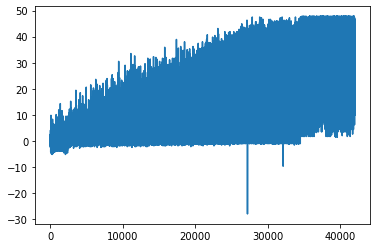

In [ ]:
scores_history = np.load('/content/drive/MyDrive/diplom/variant_2/scores.npy')

plt.plot(scores_history)
plt.show()

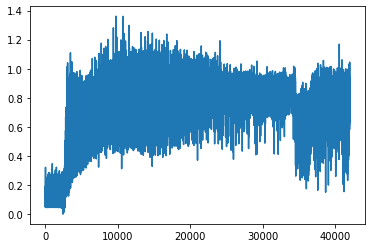

In [ ]:
scores_history = np.load('/content/drive/MyDrive/diplom/variant_2/average_scores.npy')

plt.plot(scores_history)
plt.show()

In [ ]:
checkpoint_dir = '/content/drive/MyDrive/diplom/variant_2/'
episode_start, global_step = np.load(os.path.join(checkpoint_dir, 'step_info.npy')).tolist()
scores = np.load(os.path.join(checkpoint_dir, 'scores.npy')).tolist()
average_scores = np.load(os.path.join(checkpoint_dir, 'average_scores.npy')).tolist()
playfield_size = 8
mines_count = 10
epsilon = 0.0
episodes = 1000000

test_minesweeper = Minesweeper(mines_count, playfield_size)
agent = Agent(playfield_size, epsilon)

In [ ]:
step_field = test_minesweeper_game()


0.1      -0.12    -0.07    -0.05    -0.05    -0.04    -0.06    0.05     
-0.13    -0.24    -0.13    -0.16    -0.16    -0.15    -0.16    -0.04    
-0.03    -0.12    -0.08    -0.16    -0.19    -0.12    -0.14    0.01     
-0.27    -0.16    -0.27    0.21     -0.09    -0.1     -0.16    0.02     
0.68     0.62     0.75     -0.29    -0.03    -0.1     -0.16    0.02     
0.61     -0.07    0.73     -0.28    -0.03    -0.13    -0.16    0.02     
0.56     0.35     0.95     -0.38    -0.13    -0.12    -0.22    0.01     
-0.45    -0.34    -0.33    0.15     -0.13    -0.06    -0.14    0.02     



-0.52    -0.31    -0.74    -0.36    -0.76    -0.35    0.04     0.22     
-0.05    -0.38    -0.66    -0.55    -0.62    -0.35    0.14     0.19     
0.36     0.16     -0.54    -0.52    -0.67    -0.12    0.8      0.22     
0.12     -0.16    -0.11    -0.48    0.03     -0.01    1.03     0.01     
-0.41    -0.0     -0.22    -0.14    -0.37    -0.31    0.33     0.15     
-0.48    -0.41    -0.37    -0.24    -0.2     -0

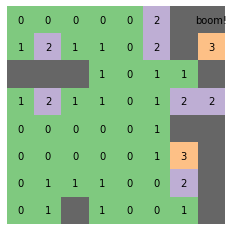

In [ ]:
result_dir = '/content/result_images/'

if os.path.exists(result_dir) is True:
  shutil.rmtree(result_dir)

os.mkdir(result_dir)

for i, field in enumerate(step_field):
  clear_output(wait=1000)
  show_result(field, i, test_minesweeper.free_point, test_minesweeper.mines_coord)

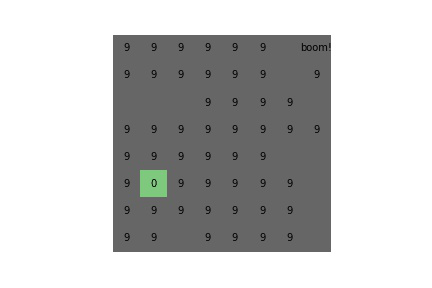

In [ ]:
images = [imageio.imread(os.path.join(result_dir, str(id) + '.jpg')) for id in range(len(os.listdir(result_dir)))]
imageio.mimsave('mw.gif', images)
Image(open('mw.gif','rb').read())

In [ ]:
train_minesweeper(episodes, epsilon, global_step, advanced=True)

ep: 1   s.: 47.8   mem.len: 7   eps: 0.0   g_step: 670356   av_q: 0.798   av_loss: 0.0
ep: 2   s.: 44.0   mem.len: 29   eps: 0.0   g_step: 670378   av_q: 0.703   av_loss: 0.0
ep: 3   s.: 31.4   mem.len: 45   eps: 0.0   g_step: 670394   av_q: 0.744   av_loss: 0.0
ep: 4   s.: 40.4   mem.len: 68   eps: 0.0   g_step: 670417   av_q: 0.759   av_loss: 0.0
ep: 5   s.: 29.6   mem.len: 73   eps: 0.0   g_step: 670422   av_q: 0.879   av_loss: 0.0
ep: 6   s.: 16.1   mem.len: 80   eps: 0.0   g_step: 670429   av_q: 0.66   av_loss: 0.0
ep: 7   s.: 43.1   mem.len: 103   eps: 0.0   g_step: 670452   av_q: 0.69   av_loss: 0.0
ep: 8   s.: 45.8   mem.len: 120   eps: 0.0   g_step: 670469   av_q: 0.81   av_loss: 0.0
ep: 9   s.: 40.4   mem.len: 132   eps: 0.0   g_step: 670481   av_q: 0.758   av_loss: 0.0
ep: 10   s.: 9.8   mem.len: 135   eps: 0.0   g_step: 670484   av_q: 0.672   av_loss: 0.0
ep: 11   s.: 15.2   mem.len: 140   eps: 0.0   g_step: 670489   av_q: 0.669   av_loss: 0.0
ep: 12   s.: 29.6   mem.len: 1

/usr/local/lib/python3.6/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


Streaming output truncated to the last 5000 lines.
ep: 18886   s.: 37.7   mem.len: 40000   eps: 0.0   g_step: 911769   av_q: 0.742   av_loss: 0.0035172
ep: 18887   s.: 47.8   mem.len: 40000   eps: 0.0   g_step: 911794   av_q: 0.708   av_loss: 0.0038802
ep: 18888   s.: 41.3   mem.len: 40000   eps: 0.0   g_step: 911818   av_q: 0.778   av_loss: 0.0031959
ep: 18889   s.: 45.8   mem.len: 40000   eps: 0.0   g_step: 911831   av_q: 0.764   av_loss: 0.0022058
ep: 18890   s.: 36.8   mem.len: 40000   eps: 0.0   g_step: 911837   av_q: 0.745   av_loss: 0.0027347
ep: 18891   s.: 37.7   mem.len: 40000   eps: 0.0   g_step: 911846   av_q: 0.707   av_loss: 0.0031974
ep: 18892   s.: 43.7   mem.len: 40000   eps: 0.0   g_step: 911860   av_q: 0.76   av_loss: 0.0040028
ep: 18893   s.: 39.5   mem.len: 40000   eps: 0.0   g_step: 911867   av_q: 0.899   av_loss: 0.0028464
ep: 18894   s.: 44.6   mem.len: 40000   eps: 0.0   g_step: 911880   av_q: 0.731   av_loss: 0.0030098
ep: 18895   s.: 42.2   mem.len: 40000   e

## 6 iteration

advanced_mode = ON, lr 2,5 -> 1, batch_size 32 -> 16

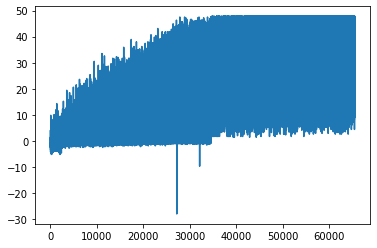

In [ ]:
scores_history = np.load('/content/drive/MyDrive/diplom/variant_2/scores.npy')

plt.plot(scores_history)
plt.show()

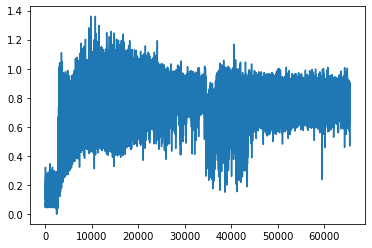

In [ ]:
scores_history = np.load('/content/drive/MyDrive/diplom/variant_2/average_scores.npy')

plt.plot(scores_history)
plt.show()

In [ ]:
checkpoint_dir = '/content/drive/MyDrive/diplom/variant_2/'
episode_start, global_step = np.load(os.path.join(checkpoint_dir, 'step_info.npy')).tolist()
scores = np.load(os.path.join(checkpoint_dir, 'scores.npy')).tolist()
average_scores = np.load(os.path.join(checkpoint_dir, 'average_scores.npy')).tolist()
playfield_size = 8
mines_count = 10
epsilon = 0.0
episodes = 1000000

test_minesweeper = Minesweeper(mines_count, playfield_size)
agent = Agent(playfield_size, epsilon)

In [ ]:
step_field = test_minesweeper_game()


0.38     0.31     0.34     0.35     0.35     0.35     0.36     0.39     
0.35     0.39     0.38     0.36     0.36     0.35     0.39     0.32     
0.41     0.35     0.27     0.26     0.3      0.31     0.35     0.33     
0.22     0.21     0.68     0.37     0.37     0.36     0.38     0.37     
0.69     0.79     0.11     0.4      0.37     0.36     0.38     0.37     
-0.79    0.85     0.44     0.42     0.34     0.36     0.4      0.36     
0.74     0.93     0.24     0.42     0.38     0.39     0.38     0.33     
0.09     0.15     0.62     0.33     0.35     0.36     0.29     0.25     



0.38     0.31     0.34     0.35     0.35     0.35     0.36     0.39     
0.34     0.41     0.31     0.29     0.29     0.35     0.39     0.32     
0.42     0.4      0.41     0.29     0.26     0.31     0.35     0.33     
0.23     0.45     0.6      0.41     0.29     0.36     0.38     0.37     
-1.59    -1.68    0.19     0.39     0.42     0.36     0.38     0.37     
-2.42    -1.8     0.31     0.22     0.38     0.

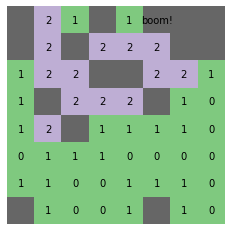

In [ ]:
result_dir = '/content/result_images/'

if os.path.exists(result_dir) is True:
  shutil.rmtree(result_dir)

os.mkdir(result_dir)

for i, field in enumerate(step_field):
  clear_output(wait=1000)
  show_result(field, i, test_minesweeper.free_point, test_minesweeper.mines_coord)

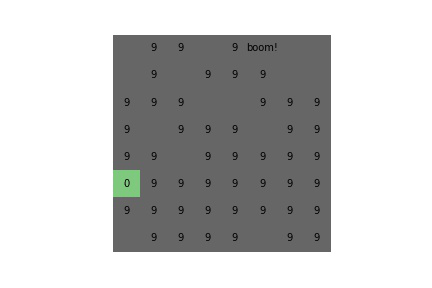

In [ ]:
images = [imageio.imread(os.path.join(result_dir, str(id) + '.jpg')) for id in range(len(os.listdir(result_dir)))]
imageio.mimsave('mw.gif', images)
Image(open('mw.gif','rb').read())

In [ ]:
train_minesweeper(episodes, epsilon, global_step, advanced=True)

ep: 1   s.: 45.8   mem.len: 23   eps: 0.0   g_step: 973724   av_q: 0.798   av_loss: 0.0
ep: 2   s.: 47.8   mem.len: 40   eps: 0.0   g_step: 973741   av_q: 0.811   av_loss: 0.0
ep: 3   s.: 36.8   mem.len: 46   eps: 0.0   g_step: 973747   av_q: 0.78   av_loss: 0.0
ep: 4   s.: 23.3   mem.len: 55   eps: 0.0   g_step: 973756   av_q: 0.88   av_loss: 0.0
ep: 5   s.: 26.9   mem.len: 62   eps: 0.0   g_step: 973763   av_q: 0.808   av_loss: 0.0
ep: 6   s.: 39.5   mem.len: 71   eps: 0.0   g_step: 973772   av_q: 0.884   av_loss: 0.0
ep: 7   s.: 43.1   mem.len: 87   eps: 0.0   g_step: 973788   av_q: 0.795   av_loss: 0.0
ep: 8   s.: 44.6   mem.len: 108   eps: 0.0   g_step: 973809   av_q: 0.728   av_loss: 0.0
ep: 9   s.: 26.9   mem.len: 118   eps: 0.0   g_step: 973819   av_q: 0.815   av_loss: 0.0
ep: 10   s.: 47.8   mem.len: 126   eps: 0.0   g_step: 973827   av_q: 0.818   av_loss: 0.0
ep: 11   s.: 36.8   mem.len: 138   eps: 0.0   g_step: 973839   av_q: 0.807   av_loss: 0.0
ep: 12   s.: 44.9   mem.len:

/usr/local/lib/python3.6/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


Streaming output truncated to the last 5000 lines.
ep: 13107   s.: 21.5   mem.len: 40000   eps: 0.0   g_step: 1153572   av_q: 0.842   av_loss: 0.0012446
ep: 13108   s.: 38.6   mem.len: 40000   eps: 0.0   g_step: 1153582   av_q: 0.768   av_loss: 0.0048169
ep: 13109   s.: 40.4   mem.len: 40000   eps: 0.0   g_step: 1153606   av_q: 0.779   av_loss: 0.0035392
ep: 13110   s.: 47.8   mem.len: 40000   eps: 0.0   g_step: 1153622   av_q: 0.773   av_loss: 0.003549
ep: 13111   s.: 44.9   mem.len: 40000   eps: 0.0   g_step: 1153638   av_q: 0.843   av_loss: 0.0016737
ep: 13112   s.: 15.2   mem.len: 40000   eps: 0.0   g_step: 1153645   av_q: 0.863   av_loss: 0.003138
ep: 13113   s.: 47.8   mem.len: 40000   eps: 0.0   g_step: 1153655   av_q: 0.732   av_loss: 0.0025656
ep: 13114   s.: 46.7   mem.len: 40000   eps: 0.0   g_step: 1153667   av_q: 0.848   av_loss: 0.0027245
ep: 13115   s.: 38.6   mem.len: 40000   eps: 0.0   g_step: 1153675   av_q: 0.912   av_loss: 0.0021524
ep: 13116   s.: 22.4   mem.len: 4

## 7 iteration

advanced_mode = ON, lr 2,5 -> 1, batch_size 32 -> 16, mines_count = 11

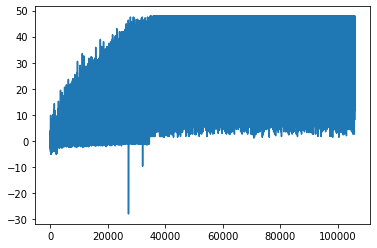

In [ ]:
scores_history = np.load('/content/drive/MyDrive/diplom/variant_2/scores.npy')

plt.plot(scores_history)
plt.show()

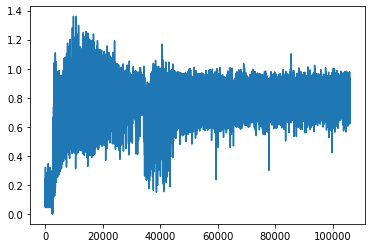

In [ ]:
scores_history = np.load('/content/drive/MyDrive/diplom/variant_2/average_scores.npy')

plt.plot(scores_history)
plt.show()

In [ ]:
checkpoint_dir = '/content/drive/MyDrive/diplom/variant_2/'
episode_start, global_step = np.load(os.path.join(checkpoint_dir, 'step_info.npy')).tolist()
scores = np.load(os.path.join(checkpoint_dir, 'scores.npy')).tolist()
average_scores = np.load(os.path.join(checkpoint_dir, 'average_scores.npy')).tolist()
playfield_size = 8
mines_count = 11
epsilon = 0.0
episodes = 1000000

test_minesweeper = Minesweeper(mines_count, playfield_size)
agent = Agent(playfield_size, epsilon)

In [ ]:
step_field = test_minesweeper_game()


0.5      0.45     0.46     0.47     0.47     0.45     0.45     0.44     
0.47     0.49     0.49     0.48     0.48     0.45     0.48     0.42     
0.48     0.46     0.44     0.43     0.43     0.42     0.46     0.43     
0.51     0.49     0.46     0.47     0.47     0.46     0.49     0.48     
0.51     0.49     0.43     0.48     0.48     0.45     0.43     0.43     
0.51     0.49     0.44     0.69     0.28     0.46     0.26     0.7      
0.46     0.48     0.44     0.26     0.85     0.84     0.9      0.24     
0.42     0.41     0.41     0.25     0.75     -0.85    0.66     0.22     



0.5      0.45     0.46     0.47     0.47     0.45     0.45     0.44     
0.47     0.49     0.45     0.45     0.42     0.45     0.46     0.41     
0.48     0.46     0.44     0.4      0.38     0.54     0.44     0.49     
0.51     0.46     0.43     0.41     0.78     0.57     0.29     0.32     
0.51     0.5      0.45     0.4      0.86     -1.08    -2.26    -1.82    
0.51     0.48     0.5      0.63     0.26     -2

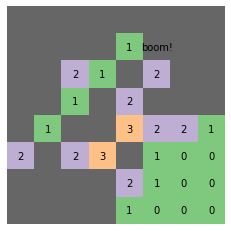

In [ ]:
result_dir = '/content/result_images/'

if os.path.exists(result_dir) is True:
  shutil.rmtree(result_dir)

os.mkdir(result_dir)

for i, field in enumerate(step_field):
  clear_output(wait=1000)
  show_result(field, i, test_minesweeper.free_point, test_minesweeper.mines_coord)

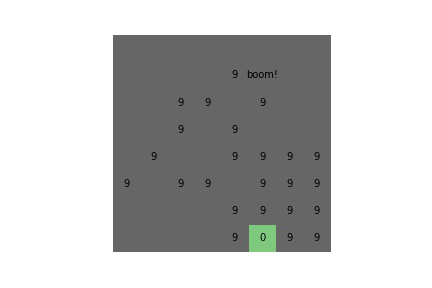

In [ ]:
images = [imageio.imread(os.path.join(result_dir, str(id) + '.jpg')) for id in range(len(os.listdir(result_dir)))]
imageio.mimsave('mw.gif', images)
Image(open('mw.gif','rb').read())

In [ ]:
train_minesweeper(episodes, epsilon, global_step, advanced=True)

ep: 1   s.: 4.4   mem.len: 3   eps: 0.0   g_step: 1533180   av_q: 0.805   av_loss: 0.0
ep: 2   s.: 25.1   mem.len: 17   eps: 0.0   g_step: 1533194   av_q: 0.791   av_loss: 0.0
ep: 3   s.: 41.0   mem.len: 34   eps: 0.0   g_step: 1533211   av_q: 0.778   av_loss: 0.0
ep: 4   s.: 6.2   mem.len: 37   eps: 0.0   g_step: 1533214   av_q: 0.709   av_loss: 0.0
ep: 5   s.: 8.9   mem.len: 42   eps: 0.0   g_step: 1533219   av_q: 0.727   av_loss: 0.0
ep: 6   s.: 46.9   mem.len: 69   eps: 0.0   g_step: 1533246   av_q: 0.775   av_loss: 0.0
ep: 7   s.: 29.3   mem.len: 81   eps: 0.0   g_step: 1533258   av_q: 0.818   av_loss: 0.0
ep: 8   s.: 23.3   mem.len: 87   eps: 0.0   g_step: 1533264   av_q: 0.793   av_loss: 0.0
ep: 9   s.: 12.5   mem.len: 91   eps: 0.0   g_step: 1533268   av_q: 0.818   av_loss: 0.0
ep: 10   s.: 39.5   mem.len: 98   eps: 0.0   g_step: 1533275   av_q: 0.88   av_loss: 0.0
ep: 11   s.: 28.7   mem.len: 108   eps: 0.0   g_step: 1533285   av_q: 0.739   av_loss: 0.0
ep: 12   s.: 34.1   mem

/usr/local/lib/python3.6/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


Streaming output truncated to the last 5000 lines.
ep: 16453   s.: 8.0   mem.len: 40000   eps: 0.0   g_step: 1763829   av_q: 0.821   av_loss: 0.0004103
ep: 16454   s.: 38.6   mem.len: 40000   eps: 0.0   g_step: 1763850   av_q: 0.859   av_loss: 0.0033765
ep: 16455   s.: 40.4   mem.len: 40000   eps: 0.0   g_step: 1763863   av_q: 0.755   av_loss: 0.003526
ep: 16456   s.: 9.8   mem.len: 40000   eps: 0.0   g_step: 1763866   av_q: 0.855   av_loss: 0.0035086
ep: 16457   s.: 35.0   mem.len: 40000   eps: 0.0   g_step: 1763882   av_q: 0.804   av_loss: 0.0035724
ep: 16458   s.: 13.4   mem.len: 40000   eps: 0.0   g_step: 1763886   av_q: 0.804   av_loss: 0.0042849
ep: 16459   s.: 46.9   mem.len: 40000   eps: 0.0   g_step: 1763906   av_q: 0.729   av_loss: 0.0026204
ep: 16460   s.: 31.4   mem.len: 40000   eps: 0.0   g_step: 1763923   av_q: 0.826   av_loss: 0.0023524
ep: 16461   s.: 46.9   mem.len: 40000   eps: 0.0   g_step: 1763945   av_q: 0.785   av_loss: 0.0033461
ep: 16462   s.: 45.7   mem.len: 40

# Results

advanced_mode = ON, mines_count = 10

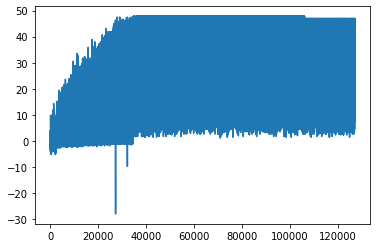

In [ ]:
scores_history = np.load('/content/drive/MyDrive/diplom/variant_2/scores.npy')

plt.plot(scores_history)
plt.show()

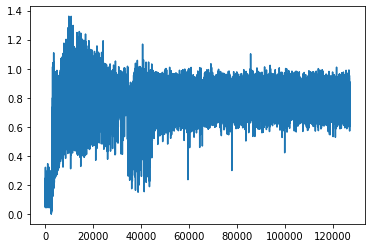

In [ ]:
scores_history = np.load('/content/drive/MyDrive/diplom/variant_2/average_scores.npy')

plt.plot(scores_history)
plt.show()

In [ ]:
checkpoint_dir = '/content/drive/MyDrive/diplom/variant_2/'
episode_start, global_step = np.load(os.path.join(checkpoint_dir, 'step_info.npy')).tolist()
scores = np.load(os.path.join(checkpoint_dir, 'scores.npy')).tolist()
average_scores = np.load(os.path.join(checkpoint_dir, 'average_scores.npy')).tolist()
playfield_size = 8
mines_count = 10
epsilon = 0.0
episodes = 1000000

test_minesweeper = Minesweeper(mines_count, playfield_size)
agent = Agent(playfield_size, epsilon)

In [ ]:
step_field = test_minesweeper_game()


0.47     0.45     0.29     0.83     -0.51    0.87     0.44     0.43     
0.45     0.46     0.24     0.88     0.8      0.86     0.38     0.4      
0.47     0.47     0.71     0.14     0.43     0.26     0.75     0.33     
0.49     0.45     0.41     0.47     0.51     0.47     0.46     0.37     
0.49     0.48     0.43     0.47     0.47     0.45     0.5      0.44     
0.49     0.48     0.45     0.47     0.47     0.45     0.51     0.4      
0.45     0.46     0.45     0.49     0.49     0.47     0.49     0.39     
0.43     0.4      0.39     0.45     0.45     0.42     0.4      0.34     



0.16     -1.92    -3.49    -4.08    -4.21    -3.42    -1.84    0.41     
0.39     -1.24    -2.42    -3.23    -3.33    -2.57    -1.23    0.64     
0.65     0.62     0.5      0.68     0.35     0.64     0.74     0.79     
0.49     0.45     0.37     0.33     0.32     0.22     0.34     0.23     
0.46     0.45     0.35     0.4      0.38     0.36     0.45     0.34     
0.49     0.48     0.45     0.47     0.47     0.

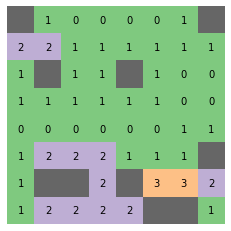

In [ ]:
result_dir = '/content/result_images/'

if os.path.exists(result_dir) is True:
  shutil.rmtree(result_dir)

os.mkdir(result_dir)

for i, field in enumerate(step_field):
  clear_output(wait=1000)
  show_result(field, i, test_minesweeper.free_point, test_minesweeper.mines_coord)

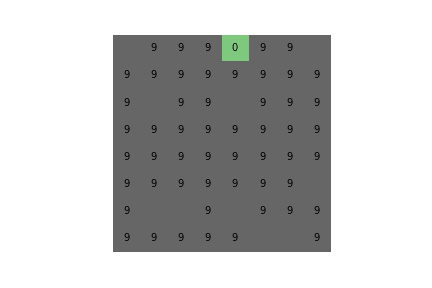

In [ ]:
images = [imageio.imread(os.path.join(result_dir, str(id) + '.jpg')) for id in range(len(os.listdir(result_dir)))]
imageio.mimsave('mw.gif', images)
Image(open('mw.gif','rb').read())

In [ ]:
# Проверим winrate, когда минер открыл все свободные мины
score = 0
n = 1000

for i in range(1, n+1):
  curr_result = check_winrate()
  score += curr_result
  if i % 100 == 0:
    print(f'{i} games - winrate {round(score*100/i, 2)} %')

print(f'Total winrate {score*100/n} %')

100 games - winrate 30.0 %
200 games - winrate 27.5 %
300 games - winrate 26.0 %
400 games - winrate 28.25 %
500 games - winrate 27.8 %
600 games - winrate 29.0 %
700 games - winrate 29.29 %
800 games - winrate 30.5 %
900 games - winrate 30.56 %
1000 games - winrate 31.8 %
Total winrate 31.8 %


In [ ]:
# Проверим winrate, когда минер не подорвался
score = 0
n = 1000

for i in range(1, n+1):
  curr_result = check_winrate(boom=True)
  score += curr_result
  if i % 100 == 0:
    print(f'{i} games - winrate {round(score*100/i, 2)} %')

print(f'Total winrate {score*100/n} %')

100 games - winrate 36.0 %
200 games - winrate 32.0 %
300 games - winrate 34.0 %
400 games - winrate 32.5 %
500 games - winrate 33.8 %
600 games - winrate 33.5 %
700 games - winrate 34.43 %
800 games - winrate 33.0 %
900 games - winrate 32.56 %
1000 games - winrate 32.0 %
Total winrate 32.0 %
